# CNN+LSTM 전력 수요 예측 

### 목차

#### 1. 모듈 임포트
<br/>

#### 2. 데이터 합본 저장
##### ㅤ-3년치 데이터
##### ㅤ-4년치 데이터
<br/>

#### 3. 그래프 확인
##### ㅤ-각 연도별 csv 데이터 로드
##### ㅤ-plt 그래프 함수
##### ㅤ-2013
##### ㅤ-2014
##### ㅤ-2015
##### ㅤ-2013-2015
<br/>

#### 4. 데이터 정규화 
##### ㅤ-Min-Max Scaling 이용, 4년치 학습 데이터 정규화
<br/>

#### 5. 데이터 연관성 분석
<br/>

#### 6. 이상치 처리
##### ㅤ-이상치 확인 함수 생성
##### ㅤ-분위별 이상치 1차 검색
##### ㅤ-이상치 치환
##### ㅤ-처리 후 잔여 개수 확인
<br/>

#### 7. 데이터셋 편집
<br/>

#### 8. 딥러닝 모델
<br/>

#### 9. 결과 표시
##### ㅤ-그래프 표시
##### ㅤ-그래프 비교 결과
##### ㅤ-성능 측정 지표
<br/>

#### 10. 예측값과 실제값 결과 csv 파일 저장
##### ㅤ-1년 단위 저장
##### ㅤ-1달 단위 저장
##### ㅤ-일주일 단위 저장


### <화면 가로 확장>

In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 1. 모듈 임포트

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### <GPU 확인>

In [3]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 2. 데이터 합본 저장

#### 3년치 데이터

In [4]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [5]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   26280 non-null  int64  
 1   DateTime     26280 non-null  int64  
 2   Graph_Date   26280 non-null  object 
 3   Day          26280 non-null  object 
 4   Holiday      26280 non-null  int64  
 5   Seq          26280 non-null  int64  
 6   Watt         26280 non-null  int64  
 7   Temp('C)     26280 non-null  float64
 8   Humidity(%)  26280 non-null  float64
 9   CPI          26280 non-null  float64
dtypes: float64(3), int64(5), object(2)
memory usage: 2.0+ MB


#### 4년치 데이터

In [6]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [7]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   35040 non-null  int64  
 1   DateTime     35040 non-null  int64  
 2   Graph_Date   35040 non-null  object 
 3   Day          35040 non-null  object 
 4   Holiday      35040 non-null  int64  
 5   Seq          35040 non-null  int64  
 6   Watt         35040 non-null  int64  
 7   Temp('C)     35040 non-null  float64
 8   Humidity(%)  35040 non-null  float64
 9   CPI          35040 non-null  float64
dtypes: float64(3), int64(5), object(2)
memory usage: 2.7+ MB


### 3. 그래프 확인

#### 각 연도별 csv 데이터 로드

In [8]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

#### Plt 그래프 함수

In [9]:
def Watt_Graph(name, x, y, year):
    font_head = {'color': 'k', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'k', 'weight': 'bold', 'size': 15}
    plt.figure(figsize=(30,10))
    plt.plot(x, y, '.-', linewidth=1, color='y')
    plt.tick_params(axis='x', colors='k', size=10, labelsize=15)
    plt.tick_params(axis='y', colors='k', size=10, labelsize=15)
    plt.xlabel("Time", labelpad=15, fontdict=font_body)
    plt.ylabel('Watt', labelpad=15, fontdict=font_body)
    plt.title(name, fontdict=font_head, pad=20)
    plt.margins(x=0.02)

    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])
        
    plt.show

In [10]:
def Weather_Graph(name1, name2, x, y1, y2, year):
    plt.figure(figsize=(30,20))
    font_head = {'color': 'k', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'k', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('#ff7f0e')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('#ff7f0e')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='k', size=10, labelsize=15)
    ax1.tick_params(axis='y', colors='k', size=10, labelsize=15)

    plt.plot(x, y1, '.-', color='#ff7f0e', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel("Temp('C)",labelpad=15, fontdict=font_body)
    
    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('royalblue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('royalblue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='k', size=10, labelsize=15)
    ax2.tick_params(axis='y', colors='k', size=10, labelsize=15)

    plt.plot(x, y2, '.-', color='#1f77b4', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Humidity(%)',labelpad=15, fontdict=font_body)
    
    plt.margins(x=0.02)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    plt.show()

#### 1년치 그래프 확인

#### 2013

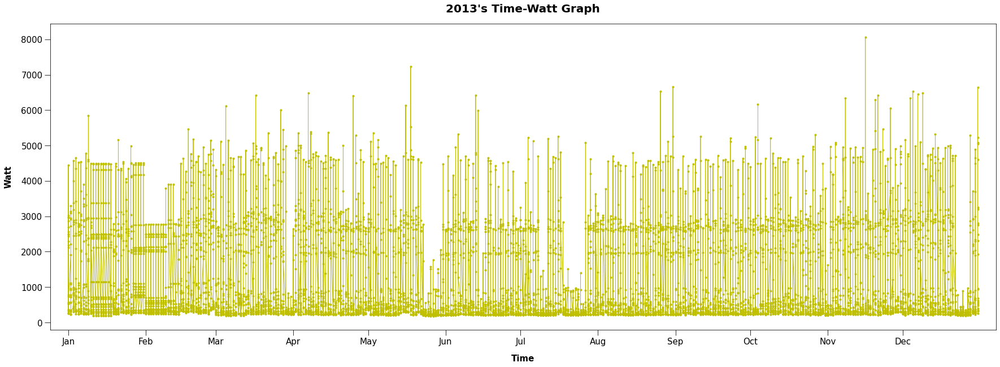

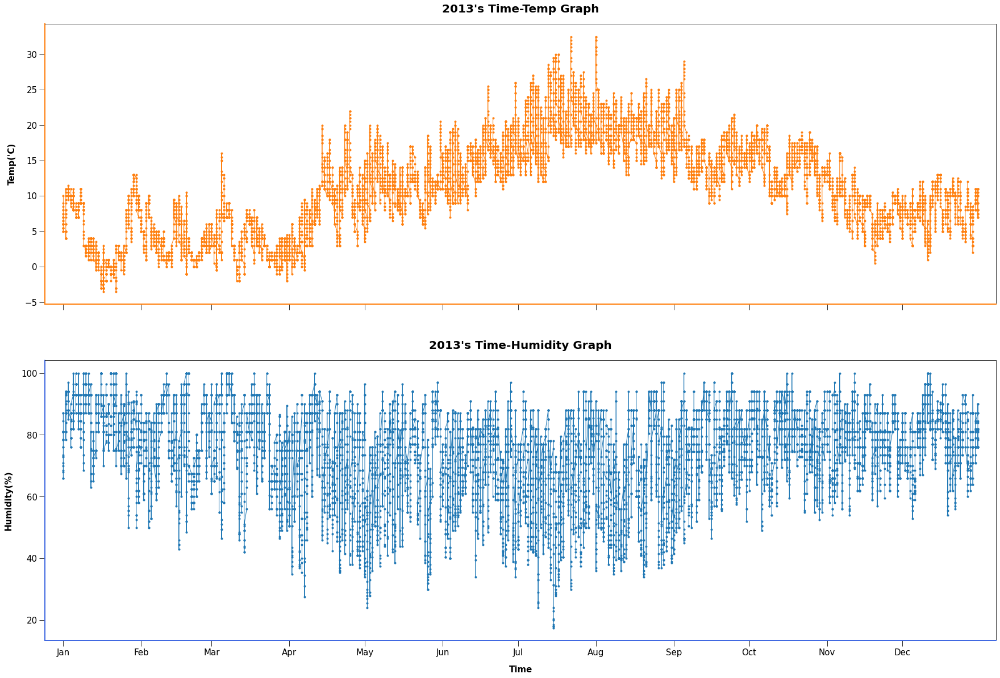

In [11]:
Watt_Graph("2013's Time-Watt Graph", Data_2013['Graph_Date'], Data_2013['Watt'], 1)
Weather_Graph("2013's Time-Temp Graph", "2013's Time-Humidity Graph", Data_2013['Graph_Date'], Data_2013["Temp('C)"], Data_2013['Humidity(%)'], 1)

#### 2014

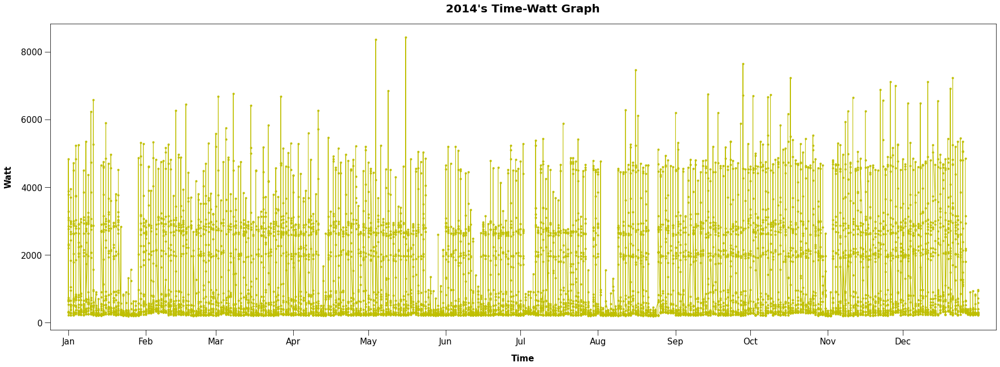

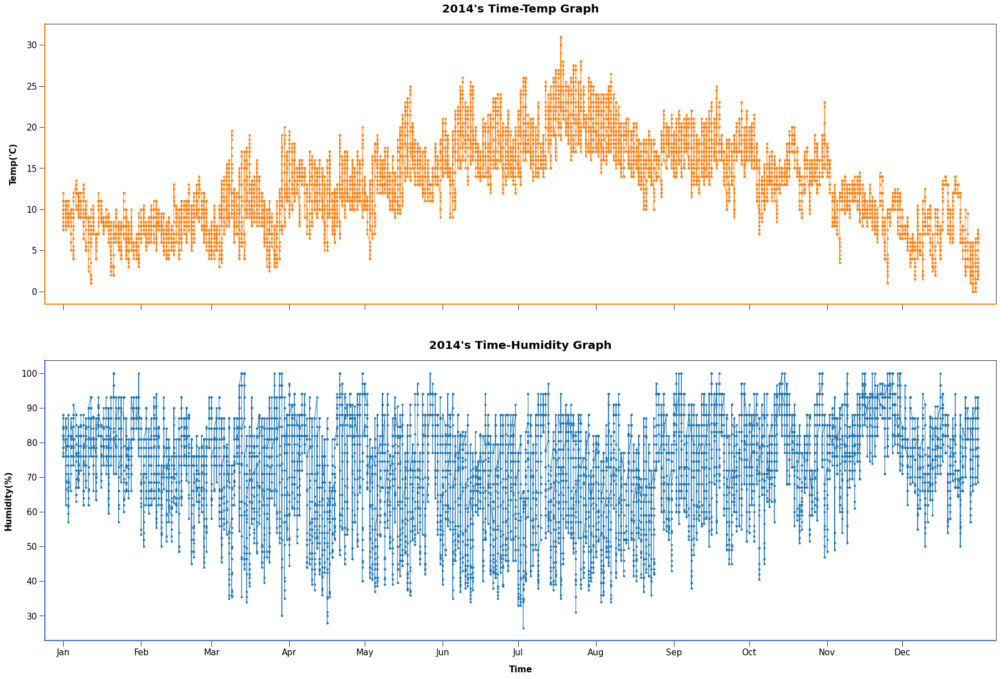

In [12]:
Watt_Graph("2014's Time-Watt Graph", Data_2014['Graph_Date'], Data_2014['Watt'], 1)
Weather_Graph("2014's Time-Temp Graph", "2014's Time-Humidity Graph", Data_2014['Graph_Date'], Data_2014["Temp('C)"], Data_2014['Humidity(%)'], 1)

#### 2015

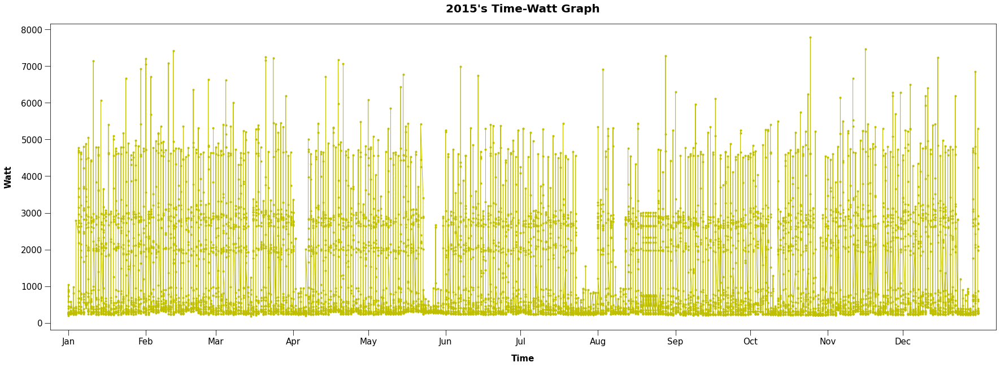

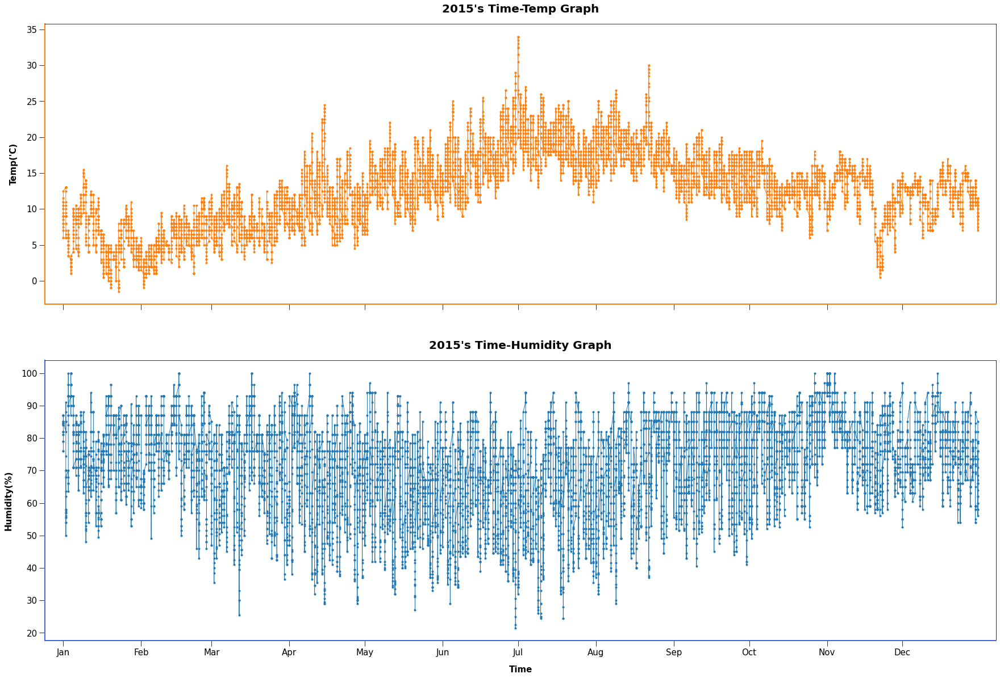

In [13]:
Watt_Graph("2015's Time-Watt Graph", Data_2015['Graph_Date'], Data_2015['Watt'], 1)
Weather_Graph("2015's Time-Temp Graph", "2015's Time-Humidity Graph", Data_2015['Graph_Date'], Data_2015["Temp('C)"], Data_2015['Humidity(%)'], 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

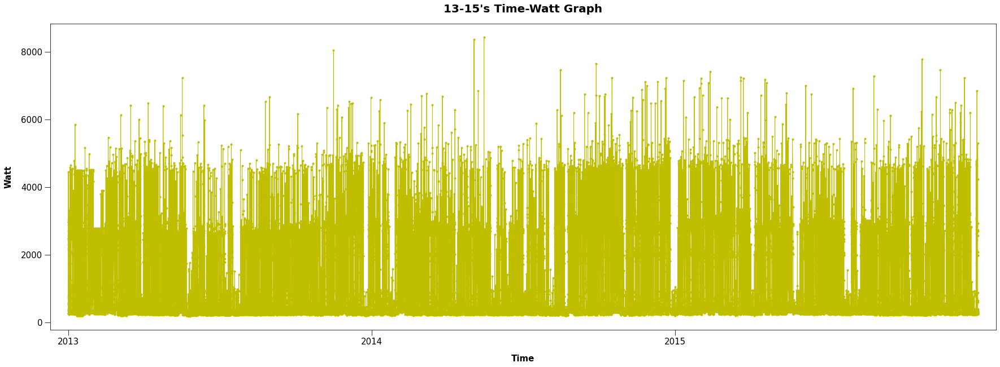

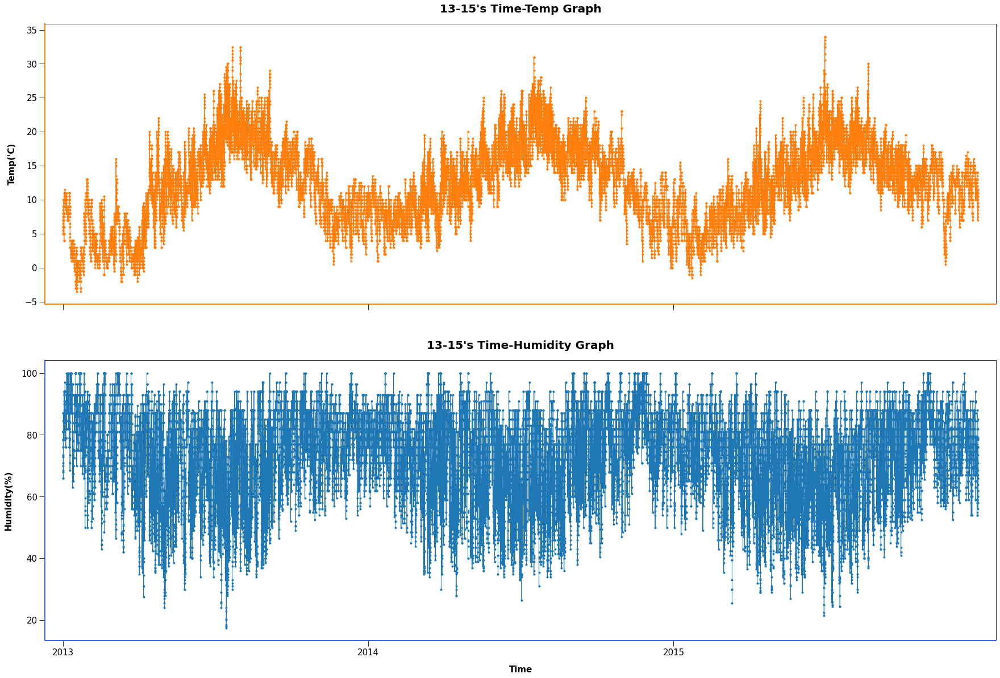

In [14]:
Watt_Graph("13-15's Time-Watt Graph", Data_3Y['Graph_Date'], Data_3Y['Watt'], 3)
Weather_Graph("13-15's Time-Temp Graph", "13-15's Time-Humidity Graph", Data_3Y['Graph_Date'], Data_3Y["Temp('C)"], Data_3Y['Humidity(%)'], 3)

### 4. 데이터 정규화

#### Min-Max Scaling 이용, 4년치 학습 데이터 정규화

In [15]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
# 배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', "Temp('C)", 'Humidity(%)', 'CPI']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp('C),Humidity(%),CPI
0,20130101,2013-01-01,1.0,0.270038,0.360000,0.812121,0.933333
1,20130101,2013-01-01,1.0,0.268530,0.333333,0.842424,0.933333
2,20130101,2013-01-01,1.0,0.263775,0.320000,0.842424,0.933333
3,20130101,2013-01-01,1.0,0.011368,0.306667,0.769697,0.933333
4,20130101,2013-01-01,1.0,0.010788,0.306667,0.739394,0.933333
...,...,...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333,0.812121,0.566667
35036,20161231,2016-12-31,1.0,0.182809,0.333333,0.781818,0.566667
35037,20161231,2016-12-31,1.0,0.089781,0.306667,0.842424,0.566667
35038,20161231,2016-12-31,1.0,0.049878,0.306667,0.842424,0.566667


### 5. 데이터 연관성 분석

In [16]:
import scipy.stats as stats

# 피어슨 stat을 이용하면 피어슨 상관계수와 p-value값이 출력되는데 상관계수는 양 or 음의 비례관계 정도를, p-value는 상관 정도를 보여준다. (0에 가까울수록 영향이 크다.)

Correlation=stats.pearsonr(Data_4Y_scaled['Holiday'], Data_4Y_scaled['Watt'])
print('< Holiday - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled["Temp('C)"], Data_4Y_scaled['Humidity(%)'])
print('< Temp - Humidity >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled["Temp('C)"], Data_4Y_scaled['Watt'])
print('< Temp - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['Humidity(%)'], Data_4Y_scaled['Watt'])
print('< Humidity - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['CPI'], Data_4Y_scaled['Watt'])
print('< CPI - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

< Holiday - Watt >
P-value ==>> 0.000

< Temp - Humidity >
P-value ==>> 0.000

< Temp - Watt >
P-value ==>> 0.169

< Humidity - Watt >
P-value ==>> 0.000

< CPI - Watt >
P-value ==>> 0.000



### 6. 이상치 처리

#### 이상치 확인 함수 생성

In [17]:
def get_outlier(df=None, column=None, weight=None):
    quantile_5 = np.percentile(df[column].values, 5)
    quantile_25 = np.percentile(df[column].values, 25)
    quantile_50 = np.percentile(df[column].values, 50)
    quantile_75 = np.percentile(df[column].values, 75)
    quantile_95 = np.percentile(df[column].values, 95)
    
    IQR = quantile_75 - quantile_25
    IQR_weight = IQR * weight

    lowest_val = quantile_25-IQR_weight
    highest_val = quantile_75+IQR_weight
    
    outlier_index_lowest = df[column][df[column] < quantile_5].index
    outlier_index_low = df[column][df[column] < lowest_val].index
    outlier_index_high = df[column][df[column] > highest_val].index
    outlier_index_highest = df[column][df[column] > quantile_95].index
    
    
    return outlier_index_lowest, outlier_index_low, outlier_index_high, outlier_index_highest, quantile_5, quantile_25, quantile_50, quantile_75, quantile_95

#### 분위별 이상치 1차 검색 (외부 울타리)

In [18]:
WEIGHT=2.5
Lowest_list = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[0]
Highest_list = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[3]

print('Lowest Outlier ==>> {}\n'.format(Lowest_list))
print('Low Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[1]))
print('High Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[2]))
print('Highest Outlier ==>> {}\n'.format(Highest_list))

print('5% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[4]))
print('25% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[5]))
print('50% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[6]))
print('75% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[7]))
print('95% Value ==>> {}'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[8]))

Lowest Outlier ==>> Int64Index([  241,   242,   265,   266,   289,   290,   313,   314,   337,
              338,
            ...
            34986, 34987, 34992, 34993, 34996, 34997, 35001, 35005, 35008,
            35010],
           dtype='int64', length=1680)

Low Outlier ==>> Int64Index([], dtype='int64')

High Outlier ==>> Int64Index([7671, 11721, 12007, 14225, 15250, 18547, 24660, 25184, 28567,
            35025],
           dtype='int64')

Highest Outlier ==>> Int64Index([    8,    56,    79,    90,   111,   131,   186,   190,   199,
              211,
            ...
            34666, 34688, 34783, 34832, 34836, 34880, 34906, 34907, 35025,
            35026],
           dtype='int64', length=1752)

5% Value ==>> 0.006843753624869504

25% Value ==>> 0.014499478018791326

50% Value ==>> 0.03932258438696207

75% Value ==>> 0.24834705950585778

95% Value ==>> 0.47988052430112466


#### 이상치 치환 (외부 울타리)

In [19]:
"""
단순 치환이 아니라 루트(가중치)를 각각의 값에 곱하거나 나눠서 처리
5% 미만은 곱해주고, 95% 초과는 나눠줌.
그러면 값들이 똑같아져 학습에 악영향을 주는 것도 방지할 뿐더러 이상치 범위도 처리 가능함.
4분위 계산에서는 기존처럼 치환 but! 5%와 95% 처리후 처리가 되어서 4분위 처리에 중복으로 처리되는지 확인 필요!
"""

'\n단순 치환이 아니라 루트(가중치)를 각각의 값에 곱하거나 나눠서 처리\n5% 미만은 곱해주고, 95% 초과는 나눠줌.\n그러면 값들이 똑같아져 학습에 악영향을 주는 것도 방지할 뿐더러 이상치 범위도 처리 가능함.\n4분위 계산에서는 기존처럼 치환 but! 5%와 95% 처리후 처리가 되어서 4분위 처리에 중복으로 처리되는지 확인 필요!\n'

In [20]:
WEIGHT_R=np.sqrt(WEIGHT)

for i in range(len(Lowest_list)):
    Data_4Y_scaled['Watt'][Lowest_list[i]] = Data_4Y_scaled['Watt'][Lowest_list[i]]*WEIGHT_R
    
for i in range(len(Highest_list)):
    Data_4Y_scaled['Watt'][Highest_list[i]] = Data_4Y_scaled['Watt'][Highest_list[i]]/WEIGHT_R

C:\Users\82108\AppData\Local\Temp/ipykernel_10936/3830384019.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Data_4Y_scaled['Watt'][Lowest_list[i]] = Data_4Y_scaled['Watt'][Lowest_list[i]]*WEIGHT_R
C:\Users\82108\AppData\Local\Temp/ipykernel_10936/3830384019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Data_4Y_scaled['Watt'][Highest_list[i]] = Data_4Y_scaled['Watt'][Highest_list[i]]/WEIGHT_R


In [21]:
"""
high_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[2].values.tolist()

for l in range(len(high_val)):
    Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[7]
    """

"\nhigh_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[2].values.tolist()\n\nfor l in range(len(high_val)):\n    Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[7]\n    "

In [22]:
"""
lowest_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=2.5)[0].values.tolist()

for l in range(len(lowest_val)):
    Data_4Y_scaled['Watt'][lowest_val[l]] = Data_4Y_scaled['Watt'][lowest_val[l]]+get_outlier(df=Data_4Y_scaled, column='Watt', weight=2.5)[5]
    """

"\nlowest_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=2.5)[0].values.tolist()\n\nfor l in range(len(lowest_val)):\n    Data_4Y_scaled['Watt'][lowest_val[l]] = Data_4Y_scaled['Watt'][lowest_val[l]]+get_outlier(df=Data_4Y_scaled, column='Watt', weight=2.5)[5]\n    "

#### 이상치 처리 후 잔여 개수 확인

In [23]:
print('Quantity of Low Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[1])))
print('Quantity of High Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=WEIGHT)[2])))

Quantity of Low Outlier ==>> 0

Quantity of High Outlier ==>> 0



### 7. 데이터셋 편집

In [24]:
TEST_SIZE = 8760 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 1 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 
BATCH_SIZE = 128
VAL_RATIO = 0.25

# train과 test셋 분할
learning = Data_4Y_scaled[:-TEST_SIZE]
VAL_SIZE = int(len(learning)*VAL_RATIO) # 비율로 계산하는게 아니라면 1년 8760개를 validation size로 설정할 수도 있음. (추후결정)
train = learning[:-VAL_SIZE]
val = learning[-VAL_SIZE:]
test= Data_4Y_scaled[-TEST_SIZE:]

In [25]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', "Temp('C)", 'Humidity(%)', 'CPI']
label_cols = ['Watt']

train_feature = learning[feature_cols]
train_label = learning[label_cols]

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=VAL_RATIO, random_state=0, shuffle=False)

In [26]:
x_train.shape, y_train.shape

((19710, 5), (19710, 1))

In [27]:
x_valid.shape, y_valid.shape

((6570, 5), (6570, 1))

In [28]:
def windowed_dataset(series, window_size, batch_size, shuffle):
    series = tf.expand_dims(series, axis=-1)
    ds = tf.data.Dataset.from_tensor_slices(series)
    ds = ds.window(window_size + 1, shift=1, drop_remainder=True)
    ds = ds.flat_map(lambda w: w.batch(window_size + 1))
    if shuffle:
        ds = ds.shuffle(1000)
    ds = ds.map(lambda w: (w[:-1], w[-1]))
    return ds.batch(batch_size).prefetch(1)

In [29]:
train_data = windowed_dataset(y_train, WINDOW_SIZE, BATCH_SIZE, False) 
valid_data = windowed_dataset(y_valid, WINDOW_SIZE, BATCH_SIZE, False)

In [30]:
for data in train_data.take(1):
    print(f'데이터셋(X) 구성(batch_size, window_size, feature갯수): {data[0].shape}')
    print(f'데이터셋(Y) 구성(batch_size, window_size, feature갯수): {data[1].shape}')

데이터셋(X) 구성(batch_size, window_size, feature갯수): (128, 1, 1, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (128, 1, 1)


### 8. 딥러닝 모델

In [31]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPooling1D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional
from keras.layers.wrappers import TimeDistributed
from tensorflow.keras.losses import Huber
from tensorflow.keras.utils import plot_model
import keras

model = Sequential([
    Conv1D(filters=64, kernel_size=7, padding="causal", activation="swish", input_shape=[WINDOW_SIZE, 1]),
    TimeDistributed(Dense(64)),
    Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='ave'),
    Bidirectional(LSTM(32, activation='ReLU', return_sequences=True), merge_mode='ave'),
    Bidirectional(LSTM(32, activation='ReLU', return_sequences=True), merge_mode='ave'),
    Bidirectional(LSTM(16, activation='ReLU', return_sequences=False), merge_mode='ave'),
    Dense(1, activation='ReLU')
                    ])

model.summary()
#model.compile(loss='mean_squared_error', optimizer='Nadam')
model.compile(loss='mean_absolute_error', optimizer='Nadam')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 1, 64)             512       
                                                                 
 time_distributed (TimeDistr  (None, 1, 64)            4160      
 ibuted)                                                         
                                                                 
 bidirectional (Bidirectiona  (None, 1, 64)            66048     
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 1, 32)            24832     
 nal)                                                            
                                                                 
 bidirectional_2 (Bidirectio  (None, 1, 32)            16640     
 nal)                                                   

#### Plot model 저장

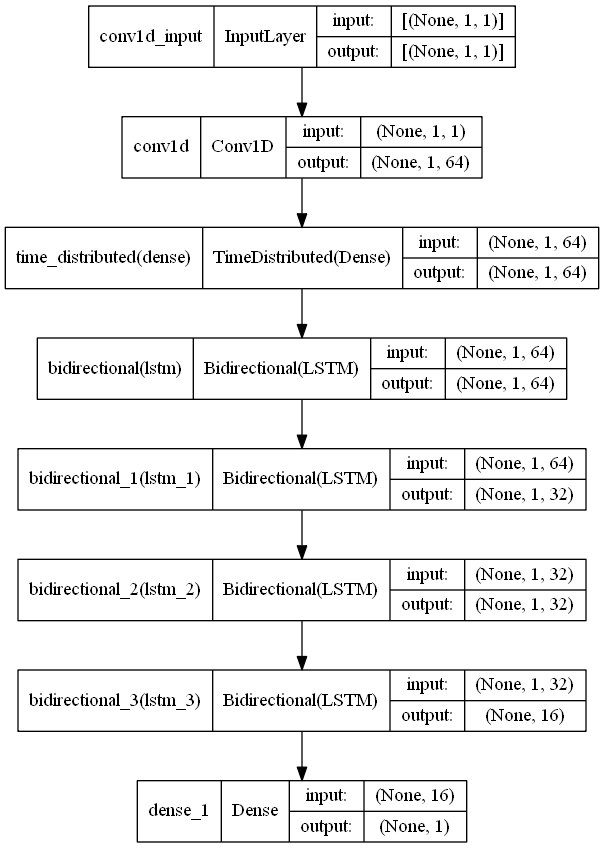

In [32]:
from keras.utils.vis_utils import plot_model
import pydot
import pydotplus
import graphviz

plot_model(model, to_file='./Result/CNN+LSTM/model.png')
plot_model(model, to_file='./Result/CNN+LSTM/model_shapes.png', show_shapes=True)

#### 학습

In [33]:
#early_stop = EarlyStopping(monitor='val_loss', patience=20)

with tf.device('/GPU:0'):
    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint_CL.h5')
    checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    history = model.fit(train_data, epochs=80, batch_size=BATCH_SIZE, validation_data=(valid_data), callbacks=[checkpoint])

Epoch 1/80
    154/Unknown - 16s 54ms/step - loss: 0.0943
Epoch 00001: val_loss improved from inf to 0.08603, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 19s 70ms/step - loss: 0.0943 - val_loss: 0.0860
Epoch 2/80
154/154 [==============================] - ETA: 0s - loss: 0.0828
Epoch 00002: val_loss improved from 0.08603 to 0.08327, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 9s 56ms/step - loss: 0.0828 - val_loss: 0.0833
Epoch 3/80
154/154 [==============================] - ETA: 0s - loss: 0.0822
Epoch 00003: val_loss improved from 0.08327 to 0.08302, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 9s 57ms/step - loss: 0.0822 - val_loss: 0.0830
Epoch 4/80
154/154 [==============================] - ETA: 0s - loss: 0.0821
Epoch 00004: val_loss did not improve from 0.08302
154/154 [==============================] - 9s 56ms/step - loss: 0.0821 - val_loss: 0.0832
Epoch 

Epoch 38/80
154/154 [==============================] - ETA: 0s - loss: 0.0817
Epoch 00038: val_loss did not improve from 0.08302
154/154 [==============================] - 9s 58ms/step - loss: 0.0817 - val_loss: 0.0833
Epoch 39/80
154/154 [==============================] - ETA: 0s - loss: 0.0816
Epoch 00039: val_loss did not improve from 0.08302
154/154 [==============================] - 9s 57ms/step - loss: 0.0816 - val_loss: 0.0834
Epoch 40/80
154/154 [==============================] - ETA: 0s - loss: 0.0816
Epoch 00040: val_loss did not improve from 0.08302
154/154 [==============================] - 9s 57ms/step - loss: 0.0816 - val_loss: 0.0834
Epoch 41/80
154/154 [==============================] - ETA: 0s - loss: 0.0816
Epoch 00041: val_loss did not improve from 0.08302
154/154 [==============================] - 9s 60ms/step - loss: 0.0816 - val_loss: 0.0835
Epoch 42/80
154/154 [==============================] - ETA: 0s - loss: 0.0816
Epoch 00042: val_loss did not improve from 0.0

Epoch 74/80
154/154 [==============================] - ETA: 0s - loss: 0.0813
Epoch 00074: val_loss improved from 0.08280 to 0.08278, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 9s 59ms/step - loss: 0.0813 - val_loss: 0.0828
Epoch 75/80
154/154 [==============================] - ETA: 0s - loss: 0.0813
Epoch 00075: val_loss improved from 0.08278 to 0.08277, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 9s 58ms/step - loss: 0.0813 - val_loss: 0.0828
Epoch 76/80
154/154 [==============================] - ETA: 0s - loss: 0.0812
Epoch 00076: val_loss improved from 0.08277 to 0.08271, saving model to model\tmp_checkpoint_CL.h5
154/154 [==============================] - 9s 57ms/step - loss: 0.0812 - val_loss: 0.0827
Epoch 77/80
154/154 [==============================] - ETA: 0s - loss: 0.0813
Epoch 00077: val_loss did not improve from 0.08271
154/154 [==============================] - 9s 56ms/step - loss: 0.0813

In [34]:
model.load_weights(filename)
pred = model.predict(test['Watt'])

pred.shape

(8760, 1)

### 9. 결과 표시

In [35]:
try:
    os.mkdir('./Result')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [36]:
try:
    os.mkdir('./Result/CNN+LSTM')
    os.mkdir('./Result/CNN+LSTM/Graph')
    os.mkdir('./Result/CNN+LSTM/Data')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


<function matplotlib.pyplot.show(close=None, block=None)>

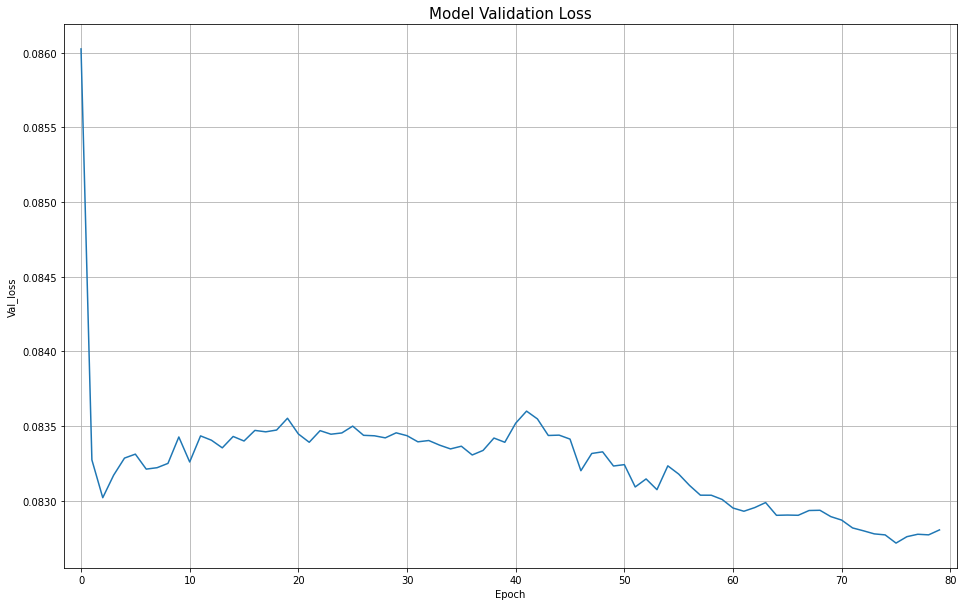

In [37]:
plt.figure(figsize=(16, 10))
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])
plt.margins(x=0.02)
plt.savefig('./Result/CNN+LSTM/Graph/Model_Valdation_Loss.png')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

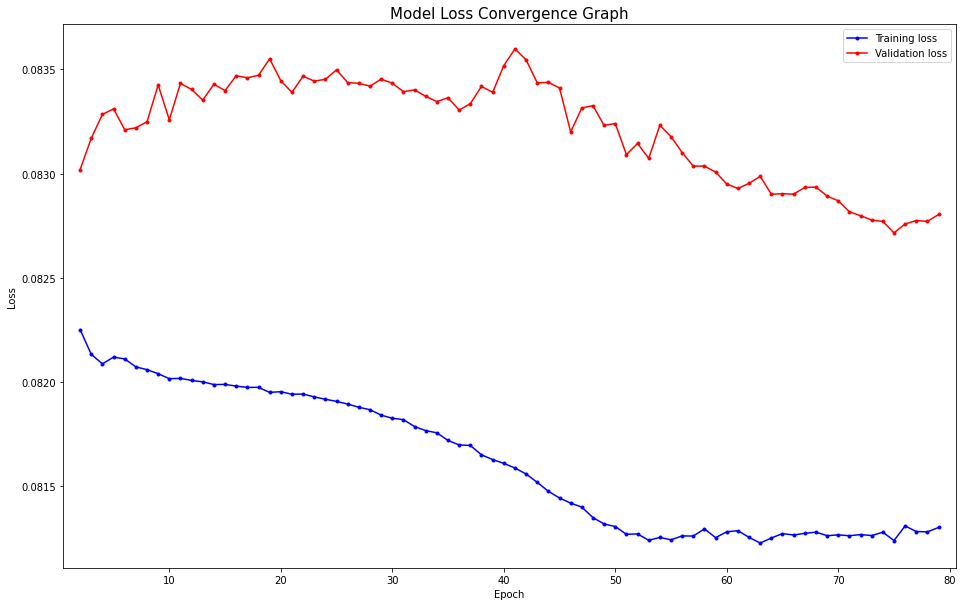

In [38]:
plt.figure(figsize=(16, 10))
plt.title('Model Loss Convergence Graph', size='15')
y_tloss = history.history['loss']
y_vloss = history.history['val_loss']
x_len = np.arange(len(y_tloss))
plt.xlabel('Epoch')
plt.ylabel('Loss')

# 그래프의 가시성을 높이기 위해 초반 2개의 급격한 감소를 그래프에서 삭제하고 세밀한 변화를 위주로 표현
y_tloss=y_tloss[2:]
y_vloss=y_vloss[2:]
x_len=x_len[2:]

plt.plot(x_len, y_tloss, "o-", c="blue", markersize=3)
plt.plot(x_len, y_vloss, "o-", c="red", markersize=3)
plt.margins(x=0.02)
plt.legend(['Training loss', 'Validation loss'])
plt.savefig('./Result/CNN+LSTM/Graph/Model_Loss_Convergence_Graph.png')
plt.show

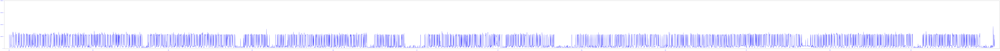

In [39]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='blue', size=15)
plt.tick_params(axis='x', colors='blue', labelsize=12)
plt.tick_params(axis='y', colors='blue', size=15)
plt.tick_params(axis='y', colors='blue', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/CNN+LSTM/Graph/Prediction.png')
plt.show()

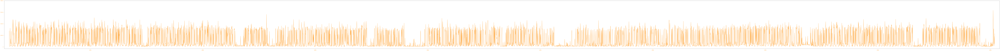

In [40]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='darkorange', size=15)
plt.tick_params(axis='x', colors='darkorange', labelsize=12)
plt.tick_params(axis='y', colors='darkorange', size=15)
plt.tick_params(axis='y', colors='darkorange', labelsize=12)

x=test['Graph_Date']

plt.plot(test['Watt'], label = 'Actual', color='darkorange')

#plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/CNN+LSTM/Graph/Actual.png')
plt.show()

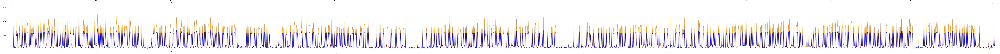

In [41]:
fig = plt.figure(figsize=(300,15)) 
ax1 = fig.add_subplot() # subplot 그래프 생성
ax1.tick_params(axis='y', size=20, labelsize=20) # y축 눈금 표기 설정
ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

color1 = 'darkorange'
ax1.plot(test['Watt'], color=color1)
ax1.set_ylabel('y', size=20)
ax1.tick_params(axis='y')
ax1.tick_params(axis='x', size=20, labelsize=20)
ax1.margins(x=0.005)
ax1.set_xticks([26280, 26280+31*24, 26280+59*24, 26280+90*24, 26280+120*24, 26280+151*24, 26280+181*24, 26280+212*24, 26280+243*24, 26280+273*24, 26280+304*24, 26280+334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) # x1의 칸당 간격(=ticks) 설정
ax1.legend(['Actual'], loc=1, bbox_to_anchor=(0.995, 1, 0, 0))

color2 = 'blue'
ax2 = ax1.twiny()
ax2.plot(pred, color=color2)
ax2.tick_params(axis='x', size=20, labelsize=20)
ax2.margins(x=0.005)
ax2.set_xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) # x1의 칸당 간격(=ticks) 설정
ax2.legend(['Predict'], loc=1, bbox_to_anchor=(1, 1, 0, 0))

plt.savefig('./Result/CNN+LSTM/Graph/Pred_with_Actual.png')
plt.show()

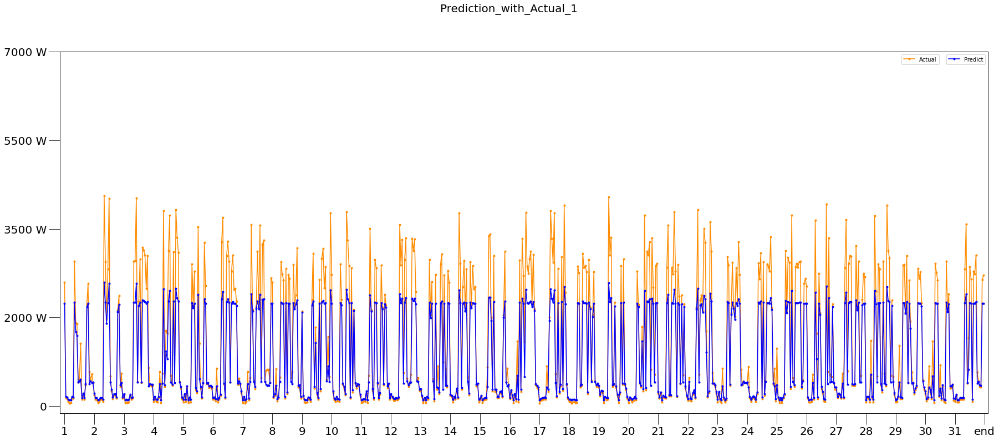

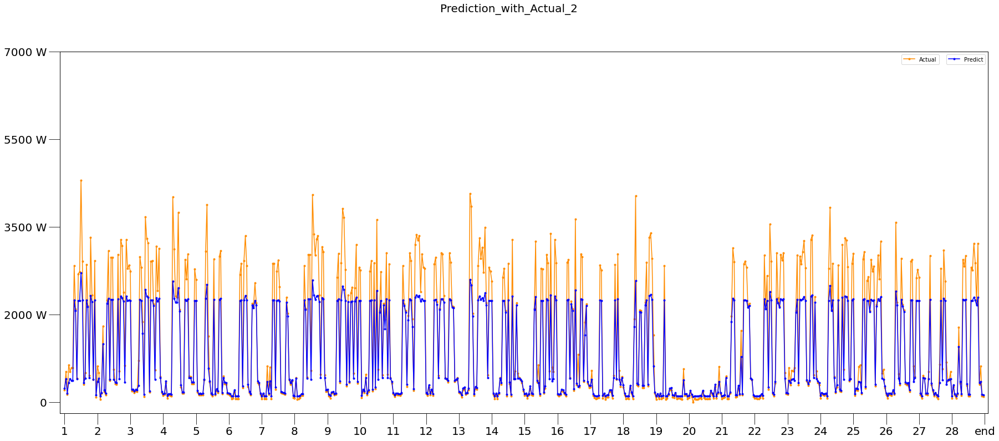

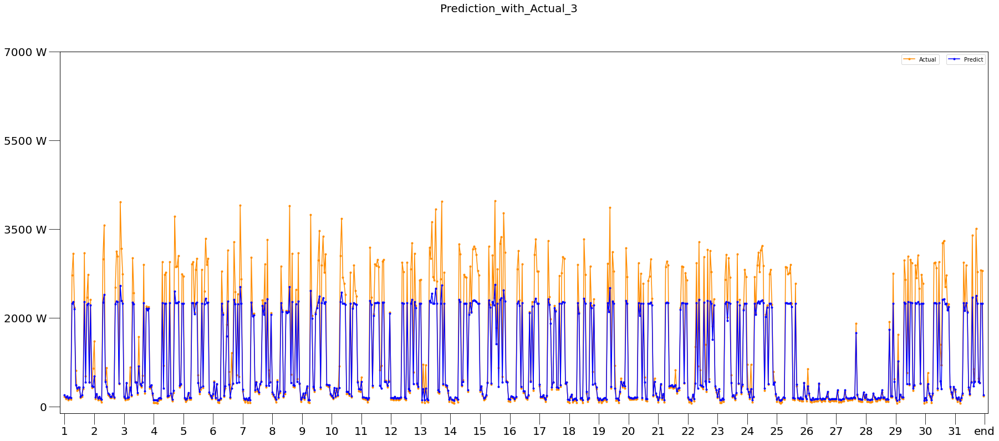

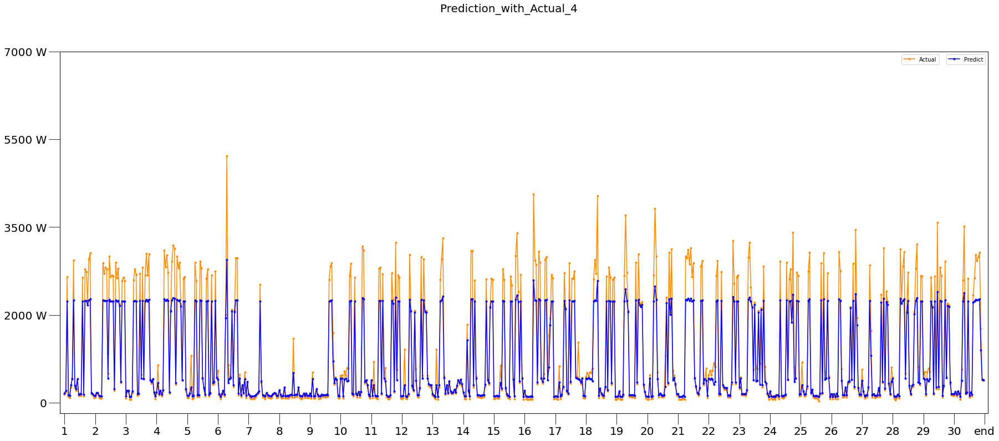

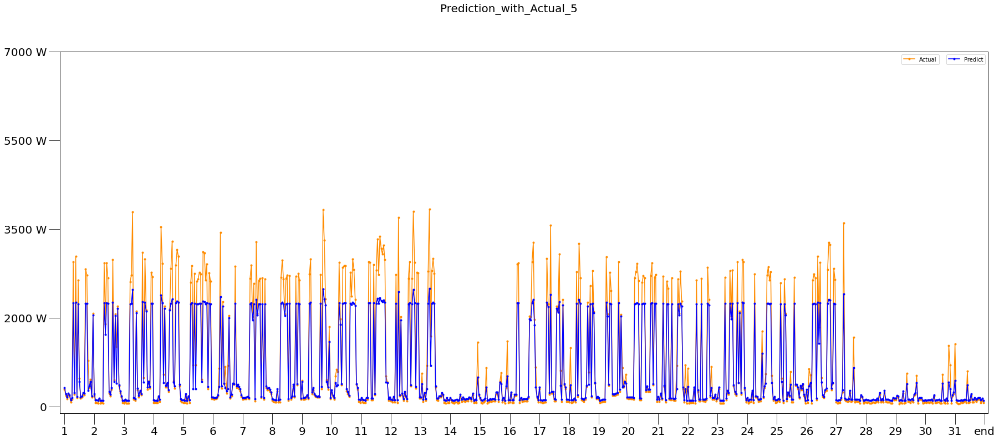

...

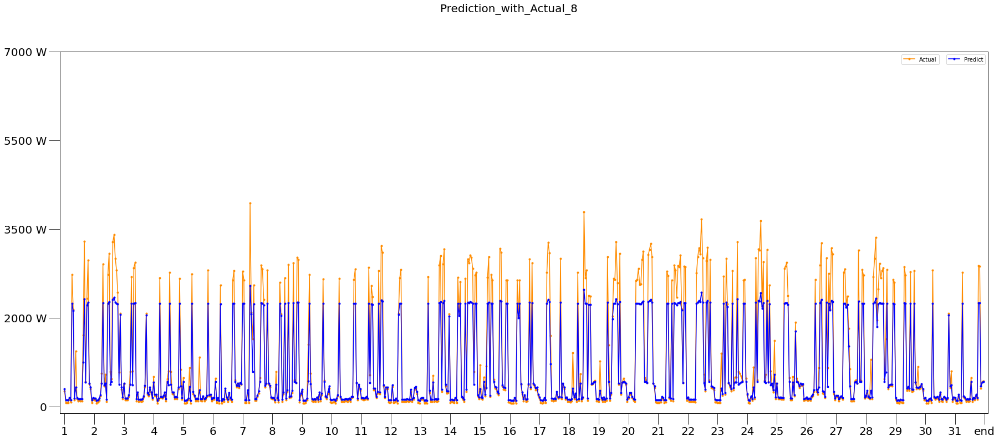

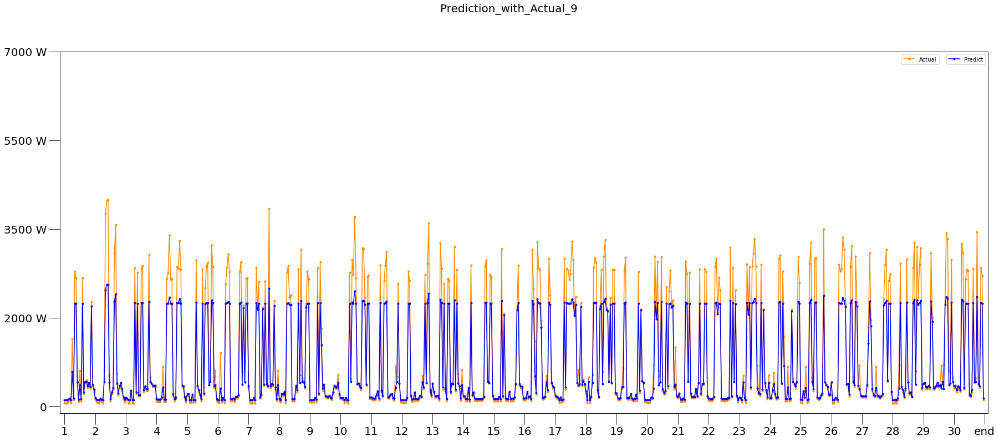

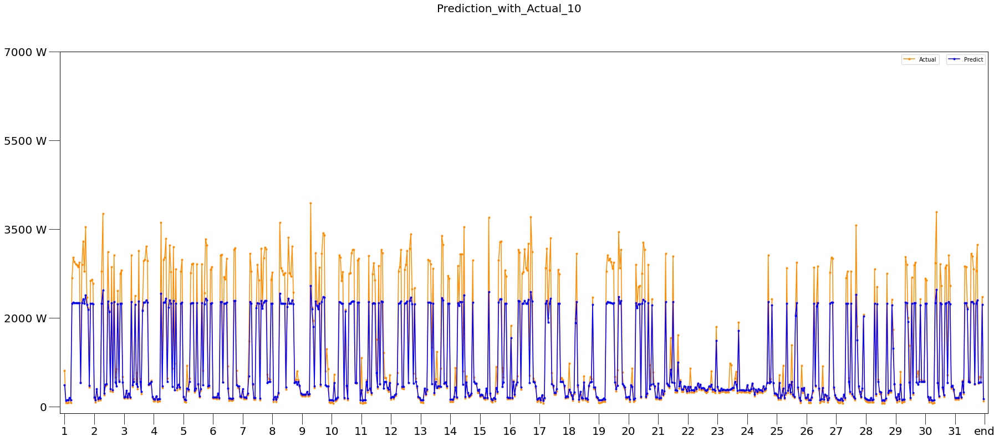

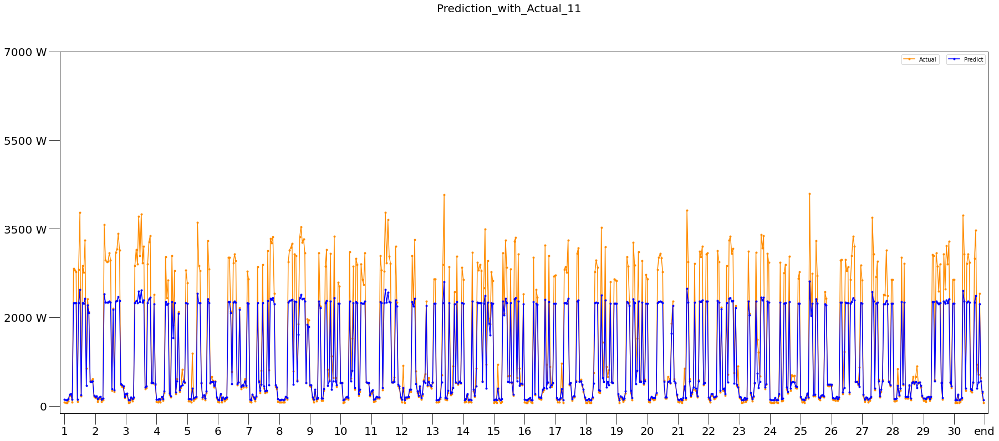

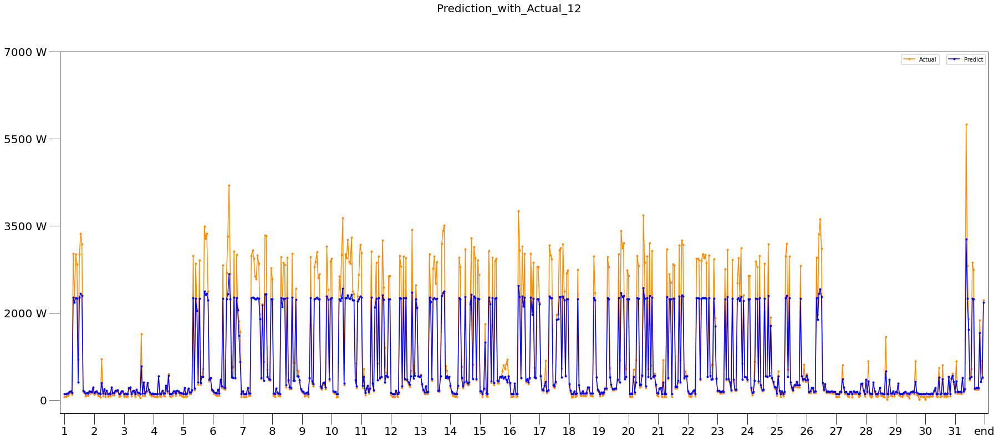

In [42]:
# 월 단위 그래프 분할 표시 및 저장
for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
        
    ax2.set_title('Prediction & Actual Graph - month'+str(m), size='15')
    
    watt_list=test['Watt'].tolist()
    
    fig = plt.figure(figsize=(30,12)) 
    ax1 = fig.add_subplot() # subplot 그래프 생성
    ax1.tick_params(axis='y', size=20, labelsize=20) # y축 눈금 표기 설정
    ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

    # Actual
    color1 = 'darkorange'
    ax1.plot(watt_list[start[m]:end[m]], color=color1, marker='.')
    ax1.tick_params(axis='x', size=20, labelsize=20)
    ax1.margins(x=0.005)
    ax1.legend(['Actual'], loc=1, bbox_to_anchor=(0.95, 1, 0, 0))
    
    # Predict
    color2 = 'blue'
    ax2 = ax1.twiny()
    ax2.plot(pred[start[m]:end[m]], color=color2, marker='.')
    ax2.tick_params(axis='x', size=20, labelsize=20)
    ax2.xaxis.set_visible(False)
    ax2.margins(x=0.005)
    ax2.legend(['Predict'], loc=1, bbox_to_anchor=(1, 1, 0, 0))
    
    # 월별 xticks 설정 함수
    def xticks_list (days):
        xticks_list=[]
        for x in range(0,days+1):
            xticks_list.append(x*24)
        return xticks_list
    
    # month labels 설정 함수
    def month_labels (days):
        month_labels=[]
        for ml in range(1,days+1):
            month_labels.append(ml)
        month_labels.append('end') 
        return month_labels
    
    if (m==2):
        ax1.set_xticks(xticks_list(28), labels=month_labels(28))

    if (m==4 or m==6  or m==9 or m==11):
        ax1.set_xticks(xticks_list(30), labels=month_labels(30))
        
    if (m==1 or m==3 or m==5 or m==7 or m==8 or m==10 or m==12):
        ax1.set_xticks(xticks_list(31), labels=month_labels(31))
        
    ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])
    
    plt.suptitle('Prediction_with_Actual_'+str(m),fontsize=20)
    plt.grid(True)
    plt.savefig('./Result/CNN+LSTM/Graph/Prediction_with_Actual_'+str(m)+'.png')
    plt.show()

#### 그래프 비교 결과

In [43]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [44]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Result/CNN+LSTM/Graph/Prediction.png')
image2 = cv2.imread('./Result/CNN+LSTM/Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [45]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=test['Watt'].tolist()

In [46]:
(score, diff) = ssim(gray1, gray2, full=True)
sim_score = round(score,5)*100

print('그래프 유사도 ==>> %.3f %%' %sim_score)

그래프 유사도 ==>> 87.267 %


#### 성능 측정 지표

In [47]:
true = test['Watt'].to_numpy()
true = true.reshape(-1,1)

In [48]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_squared_log_error as MSLE

print('r2 >> %.4f' %r2(true, pred)) # 1에 가까워야 좋음
print('MAE >> %.4f' %MAE(true, pred)) # 0에 가까워야 좋음
print('RMSE >> %.4f' %np.sqrt(MSE(true, pred))) # 0에 가까워야 좋음

r2 >> 0.8591
MAE >> 0.0282
RMSE >> 0.0498


In [49]:
RMSE = np.sqrt(MSE(test['Watt'], pred))
RMSE_pct = round(1-RMSE, 5)*100
print('RMSE 측정 정확도 ==>> %.3f %%' %RMSE_pct)

RMSE 측정 정확도 ==>> 95.016 %


### 10. 예측값과 실제값 결과 csv 파일 저장

In [50]:
# Adjusted R2 score
def A_R2(y_true, y_pred):
    err_2_sum = ((y_true-y_pred)**2).sum()
    dev_2_sum = ((y_true-np.mean(y_true))**2).sum()
    head = err_2_sum/(N-K-1)
    body = dev_2_sum/(N-1)
    return 1-(head/body)

#### 1년 단위 데이터 저장

In [51]:
# 날짜 정보 생성
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
datetime_list=[]

for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
            
        for h in range(1,25):
            elem = '2016'+'년-'+str(m)+'월-'+str(d)+'일-'+str(h)+'시'
            datetime_list.append(elem)

In [52]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(watt_list)

In [53]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart.to_csv("./Result/CNN+LSTM/Data/Electric_Prediction_result_data_for_Chart_Year.csv", encoding='cp949')

print('Job Done!!')

Job Done!!


#### 1달 단위 데이터 저장

In [54]:
pred_list=pred_df[0].tolist()
actual_list=actual_df[0].tolist()

for m in range(1,13):
    m=int(m)
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start[m]:end[m]]
    df_for_chart['pred']=pred_list[start[m]:end[m]]
    df_for_chart['actual']=actual_list[start[m]:end[m]]
    
    if m<=9:
        m=str(m)
        m='0'+m
        
    df_for_chart.to_csv("./Result/CNN+LSTM/Data/Electric_Prediction_result_data_for_Chart_"+str(m)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!


#### 일주일 단위 데이터 저장

In [55]:
try:
    os.mkdir('./Result/CNN+LSTM/Data/Week')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [56]:
count=0
for w in range(0, 8760-168, 168):
    count=int(count)
    count+=1
    start=w
    end=w+168
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start:end]
    df_for_chart['pred']=pred_list[start:end]
    df_for_chart['actual']=actual_list[start:end]
    
    if count<=9:
        count=str(count)
        count='0'+count
        
    df_for_chart.to_csv("./Result/CNN+LSTM/Data//Week/Electric_Prediction_result_data_for_Chart_"+str(count)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!
